In [155]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
sns.set_style('white')
from scipy.stats import kendalltau
from sklearn import ensemble
from sklearn import linear_model
from sklearn.feature_selection import f_classif, f_regression, SelectKBest
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import cross_val_score, GridSearchCV, ParameterGrid
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC, SVR

# Introduction

The data was extracted from the U.S. Census Bureau's 2015 American Community Survey (Tables DP03 and DP05) and published on [Kaggle](https://www.kaggle.com/muonneutrino/us-census-demographic-data). Because ACS's strength is in estimating characteristic distributions, the bureau recommends comparing derived measures such as percentages, means, and medians rather than population estimates.

## Research Interest

**Objective:** To build models that predict poverty using some combination of the data's demographic and geographic attributes.

**Original Feature Set**
- Asian: Numeric - Percentage
- Black: Numeric - Percentage
- Carpool: Numeric - Percentage
- ChildPoverty: Numeric - Percentage
- Citizen: Numeric - Count
- Construction: Numeric - Percentage
- County: Categorical
- Drive: Numeric - Percentage
- Employed: Numeric - Percentage
- FamilyWork: Numeric - Percentage
- Hispanic: Numeric Percentage
- Income: Numeric - Median Dollar Amount
- IncomeErr: Numeric - Median Dollar Amount Error
- IncomePerCap: Numeric - Dollar Amount
- IncomePerCapErr: Numeric - Dollar Amount Error
- Office: Numeric - Percentage
- OtherTransp: Numeric - Percentage
- MeanCommute: Numeric - Mean Duration
- Men: Numeric - Count
- Native: Numeric - Percentage
- Pacific: Numeric - Percentage
- Poverty: Numeric - Percentage
- PrivateWork: Numeric - Percentage
- Production: Numeric - Percentage
- Professional: Numeric - Percentage
- PublicWork: Numeric - Percentage
- SelfEmployed: Numeric - Percentage
- Service: Numeric - Percentage
- State: Categorical
- TotalPop: Numeric - Count
- Transit: Numeric - Percentage
- Unemployment: Numeric - Percentage
- Walk: Numeric - Percentage
- White: Numeric - Percentage
- Women: Numeric - Count
- WorkAtHome: Numeric - Percentage

# Data Exploration

In [2]:
census = pd.read_csv('C:\\Users\\missn\\Documents\\Thinkful\\CSV Datasets\\Unit 3 Capstone Project\\Census Tracts.csv')

In [3]:
census.shape

(74001, 37)

In [4]:
census.dtypes

CensusTract          int64
State               object
County              object
TotalPop             int64
Men                  int64
Women                int64
Hispanic           float64
White              float64
Black              float64
Native             float64
Asian              float64
Pacific            float64
Citizen              int64
Income             float64
IncomeErr          float64
IncomePerCap       float64
IncomePerCapErr    float64
Poverty            float64
ChildPoverty       float64
Professional       float64
Service            float64
Office             float64
Construction       float64
Production         float64
Drive              float64
Carpool            float64
Transit            float64
Walk               float64
OtherTransp        float64
WorkAtHome         float64
MeanCommute        float64
Employed             int64
PrivateWork        float64
PublicWork         float64
SelfEmployed       float64
FamilyWork         float64
Unemployment       float64
d

## Drops 

In [5]:
census = census.drop(labels = ['ChildPoverty', 'CensusTract','Income','IncomeErr','IncomePerCapErr'], axis = 1)

## Conversions to Percentage

In [6]:
features = ['Citizen','Employed', 'Men', 'Women']
for feature in features:
    census[feature] = (census[feature]/census['TotalPop'])*100

In [7]:
census.head()

,State,County,TotalPop,Men,Women,Hispanic,White,Black,Native,Asian,...,Walk,OtherTransp,WorkAtHome,MeanCommute,Employed,PrivateWork,PublicWork,SelfEmployed,FamilyWork,Unemployment
0,Alabama,Autauga,1948,48.254620,51.745380,0.9,87.4,7.7,0.3,0.6,...,0.5,2.3,2.1,25.0,48.408624,77.1,18.3,4.6,0.0,5.4
1,Alabama,Autauga,2156,49.118738,50.881262,0.8,40.4,53.3,0.0,2.3,...,0.0,0.7,0.0,23.4,34.925788,77.0,16.9,6.1,0.0,13.3
2,Alabama,Autauga,2968,45.956873,54.043127,0.0,74.5,18.6,0.5,1.4,...,0.0,0.0,2.5,19.6,46.260108,64.1,23.6,12.3,0.0,6.2
3,Alabama,Autauga,4423,49.106941,50.893059,10.5,82.8,3.7,1.6,0.0,...,0.0,2.6,1.6,25.3,40.289396,75.7,21.2,3.1,0.0,10.8
4,Alabama,Autauga,10763,45.730744,54.269256,0.7,68.5,24.8,0.0,3.8,...,0.0,0.6,0.9,24.8,46.799220,67.1,27.6,5.3,0.0,4.2


In [8]:
census.describe()

,TotalPop,Men,Women,Hispanic,White,Black,Native,Asian,Pacific,Citizen,...,Walk,OtherTransp,WorkAtHome,MeanCommute,Employed,PrivateWork,PublicWork,SelfEmployed,FamilyWork,Unemployment
count,74001.000000,73311.000000,73311.000000,73311.000000,73311.000000,73311.000000,73311.000000,73311.000000,73311.000000,73311.000000,...,73204.000000,73204.000000,73204.000000,73052.000000,73311.000000,73194.000000,73194.000000,73194.000000,73194.000000,73199.000000
mean,4325.591465,49.195638,50.804362,16.862810,62.032106,13.272581,0.727726,4.588253,0.145012,71.419832,...,3.123340,1.891606,4.368093,25.667357,45.499349,78.975238,14.621566,6.233814,0.169772,9.028663
std,2129.306903,4.750713,4.750713,22.940695,30.684152,21.762483,4.488340,8.794003,1.037354,10.775687,...,5.881237,2.596198,3.904990,6.964881,9.487016,8.345758,7.535786,4.042990,0.458227,5.955441
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,1.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2891.000000,46.883518,48.859366,2.400000,39.400000,0.700000,0.000000,0.200000,0.000000,66.860440,...,0.400000,0.400000,1.800000,20.800000,40.335162,74.600000,9.600000,3.500000,0.000000,5.100000
50%,4063.000000,49.053525,50.946475,7.000000,71.400000,3.700000,0.000000,1.400000,0.000000,73.666940,...,1.400000,1.100000,3.500000,25.000000,46.355799,80.100000,13.400000,5.500000,0.000000,7.700000
75%,5442.000000,51.140634,53.116482,20.400000,88.300000,14.400000,0.400000,4.800000,0.000000,78.118887,...,3.500000,2.500000,5.900000,29.800000,51.342518,84.600000,18.200000,8.100000,0.000000,11.400000
max,53812.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,91.300000,84.700000,100.000000,...,100.000000,100.000000,100.000000,80.000000,100.000000,100.000000,100.000000,100.000000,26.500000,100.000000


## Missingness

**Count similarities seem to be based on feature proximity, so any missingness most likely isn't at random - I suspect varying survey response rates by census tract are the culprit.**

In [9]:
columns = list(census.columns)
for column in columns:
    print('Missing Observations In \'{}\': {}.'.format(column,census[column].isnull().sum()))
print('Missing Observations Total: {} - {:.2%}.'.format(census.isnull().sum().sum(),census.isnull().sum().sum()/census.shape[0]))

Missing Observations In 'State': 0.
Missing Observations In 'County': 0.
Missing Observations In 'TotalPop': 0.
Missing Observations In 'Men': 690.
Missing Observations In 'Women': 690.
Missing Observations In 'Hispanic': 690.
Missing Observations In 'White': 690.
Missing Observations In 'Black': 690.
Missing Observations In 'Native': 690.
Missing Observations In 'Asian': 690.
Missing Observations In 'Pacific': 690.
Missing Observations In 'Citizen': 690.
Missing Observations In 'IncomePerCap': 740.
Missing Observations In 'Poverty': 835.
Missing Observations In 'Professional': 807.
Missing Observations In 'Service': 807.
Missing Observations In 'Office': 807.
Missing Observations In 'Construction': 807.
Missing Observations In 'Production': 807.
Missing Observations In 'Drive': 797.
Missing Observations In 'Carpool': 797.
Missing Observations In 'Transit': 797.
Missing Observations In 'Walk': 797.
Missing Observations In 'OtherTransp': 797.
Missing Observations In 'WorkAtHome': 797.
M

In [11]:
census.head()

,State,County,TotalPop,Men,Women,Hispanic,White,Black,Native,Asian,...,Walk,OtherTransp,WorkAtHome,MeanCommute,Employed,PrivateWork,PublicWork,SelfEmployed,FamilyWork,Unemployment
0,Alabama,Autauga,1948,48.254620,51.745380,0.9,87.4,7.7,0.3,0.6,...,0.5,2.3,2.1,25.0,48.408624,77.1,18.3,4.6,0.0,5.4
1,Alabama,Autauga,2156,49.118738,50.881262,0.8,40.4,53.3,0.0,2.3,...,0.0,0.7,0.0,23.4,34.925788,77.0,16.9,6.1,0.0,13.3
2,Alabama,Autauga,2968,45.956873,54.043127,0.0,74.5,18.6,0.5,1.4,...,0.0,0.0,2.5,19.6,46.260108,64.1,23.6,12.3,0.0,6.2
3,Alabama,Autauga,4423,49.106941,50.893059,10.5,82.8,3.7,1.6,0.0,...,0.0,2.6,1.6,25.3,40.289396,75.7,21.2,3.1,0.0,10.8
4,Alabama,Autauga,10763,45.730744,54.269256,0.7,68.5,24.8,0.0,3.8,...,0.0,0.6,0.9,24.8,46.799220,67.1,27.6,5.3,0.0,4.2


In [12]:
null_columns=census.columns[census.isnull().any()]
rows_with_nulls = pd.DataFrame(census[census.isnull().any(axis=1)][null_columns])
rows_with_nulls = rows_with_nulls.join(census['State'])    
rows_with_nulls.head()

,Men,Women,Hispanic,White,Black,Native,Asian,Pacific,Citizen,IncomePerCap,...,OtherTransp,WorkAtHome,MeanCommute,Employed,PrivateWork,PublicWork,SelfEmployed,FamilyWork,Unemployment,State
43,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Alabama
106,100.000000,0.000000,0.0,100.0,0.0,0.0,0.0,0.0,100.000000,NaN,...,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,Alabama
107,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Alabama
108,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Alabama
805,41.324921,58.675079,6.8,62.3,25.2,0.0,0.6,0.0,91.798107,2791.0,...,2.7,38.3,18.0,29.968454,72.6,18.9,8.4,0.0,16.7,Alabama


Note: If Nulls Are Randomly Located In Dataset - Imputation Approach Can Likewise Rely On That Randomness. MAR vs. MNAR. 

In [13]:
columns = rows_with_nulls.columns
for column in columns:
    print(column)
    print(rows_with_nulls.loc[rows_with_nulls[column].isnull(), 'State'])

Men
43           Alabama
107          Alabama
108          Alabama
868          Alabama
1063         Alabama
1460         Arizona
1857         Arizona
2372         Arizona
2376         Arizona
2870         Arizona
2871         Arizona
3357        Arkansas
3920      California
4204      California
4212      California
4255      California
4491      California
5785      California
6252      California
7048      California
7049      California
7050      California
7052      California
7053      California
7054      California
7058      California
7061      California
7063      California
7064      California
7065      California
            ...     
73497    Puerto Rico
73513    Puerto Rico
73525    Puerto Rico
73553    Puerto Rico
73559    Puerto Rico
73569    Puerto Rico
73575    Puerto Rico
73602    Puerto Rico
73620    Puerto Rico
73637    Puerto Rico
73644    Puerto Rico
73690    Puerto Rico
73695    Puerto Rico
73699    Puerto Rico
73711    Puerto Rico
73725    Puerto Rico
73854    

## Imputation Using The Median

In [14]:
census.iloc[:,2:33] = census.iloc[:,2:33].apply(lambda x: x.fillna(x.median()),axis=1)

In [15]:
threshold = 11770
census['PovertyBinary'] = np.where(census['IncomePerCap'] < threshold, 1, 0)

In [16]:
census.describe()

,TotalPop,Men,Women,Hispanic,White,Black,Native,Asian,Pacific,Citizen,...,OtherTransp,WorkAtHome,MeanCommute,Employed,PrivateWork,PublicWork,SelfEmployed,FamilyWork,Unemployment,PovertyBinary
count,74001.000000,74001.000000,74001.000000,74001.000000,74001.000000,74001.000000,74001.000000,74001.000000,74001.00000,74001.000000,...,74001.000000,74001.000000,74001.000000,74001.000000,74001.000000,74001.000000,74001.000000,74001.000000,74001.000000,74001.000000
mean,4325.591465,48.736928,50.330653,16.705578,61.453706,13.148825,0.720940,4.545471,0.14366,70.753900,...,1.897506,4.347322,25.377400,45.075104,78.142136,14.490257,6.193976,0.196064,8.957406,0.061013
std,2129.306903,6.686946,6.797153,22.890937,31.117254,21.698315,4.467913,8.764009,1.03260,12.733841,...,2.685575,3.958005,7.420189,10.406123,11.506742,7.635074,4.107698,0.912198,6.005733,0.239355
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2891.000000,46.802181,48.787995,2.300000,37.900000,0.700000,0.000000,0.200000,0.00000,66.572338,...,0.400000,1.800000,20.700000,40.122646,74.400000,9.500000,3.500000,0.000000,5.000000,0.000000
50%,4063.000000,49.018853,50.912584,6.900000,71.000000,3.600000,0.000000,1.300000,0.00000,73.570759,...,1.100000,3.500000,24.900000,46.265740,80.000000,13.300000,5.500000,0.000000,7.600000,0.000000
75%,5442.000000,51.115619,53.089989,20.200000,88.200000,14.200000,0.400000,4.800000,0.00000,78.069951,...,2.500000,5.900000,29.700000,51.283714,84.600000,18.200000,8.100000,0.000000,11.300000,0.000000
max,53812.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,91.300000,84.70000,100.000000,...,100.000000,100.000000,80.000000,100.000000,100.000000,100.000000,100.000000,37.500000,100.000000,1.000000


## Feature Visualization

### Univariate

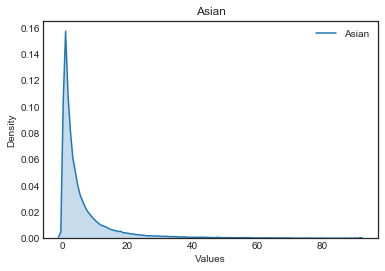

count    74001.000000
mean         4.545471
std          8.764009
min          0.000000
25%          0.200000
50%          1.300000
75%          4.800000
max         91.300000
Name: Asian, dtype: float64


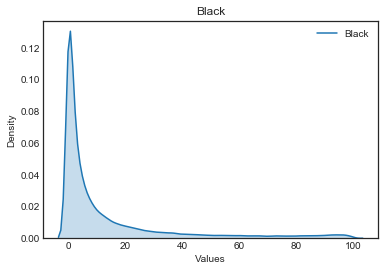

count    74001.000000
mean        13.148825
std         21.698315
min          0.000000
25%          0.700000
50%          3.600000
75%         14.200000
max        100.000000
Name: Black, dtype: float64


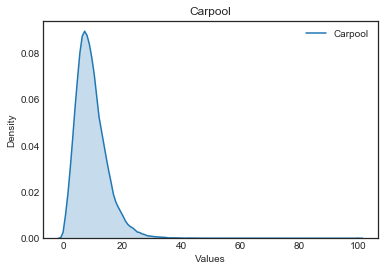

count    74001.000000
mean         9.550053
std          5.439651
min          0.000000
25%          5.900000
50%          8.700000
75%         12.300000
max        100.000000
Name: Carpool, dtype: float64


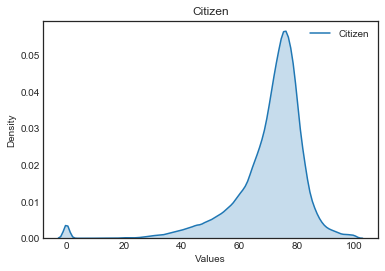

count    74001.000000
mean        70.753900
std         12.733841
min          0.000000
25%         66.572338
50%         73.570759
75%         78.069951
max        100.000000
Name: Citizen, dtype: float64


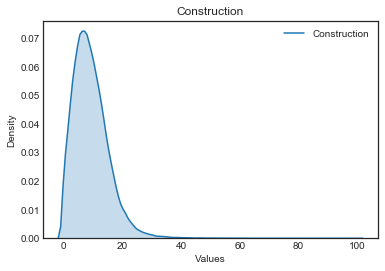

count    74001.000000
mean         9.219144
std          6.077169
min          0.000000
25%          4.900000
50%          8.300000
75%         12.500000
max        100.000000
Name: Construction, dtype: float64


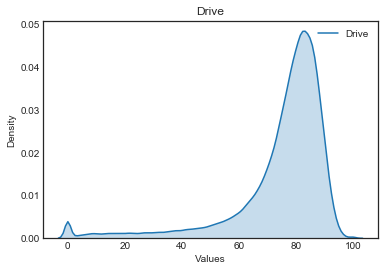

count    74001.000000
mean        74.746652
std         17.064784
min          0.000000
25%         71.600000
50%         79.600000
75%         84.900000
max        100.000000
Name: Drive, dtype: float64


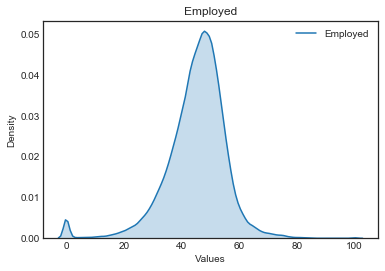

count    74001.000000
mean        45.075104
std         10.406123
min          0.000000
25%         40.122646
50%         46.265740
75%         51.283714
max        100.000000
Name: Employed, dtype: float64


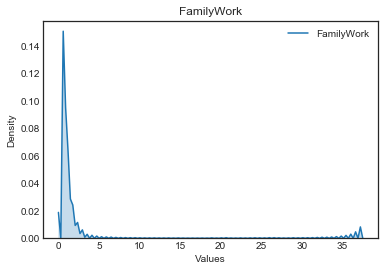

count    74001.000000
mean         0.196064
std          0.912198
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         37.500000
Name: FamilyWork, dtype: float64


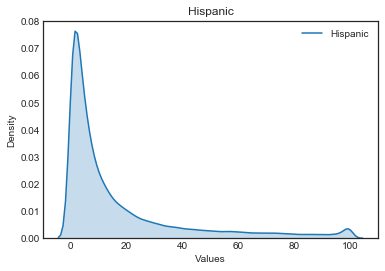

count    74001.000000
mean        16.705578
std         22.890937
min          0.000000
25%          2.300000
50%          6.900000
75%         20.200000
max        100.000000
Name: Hispanic, dtype: float64


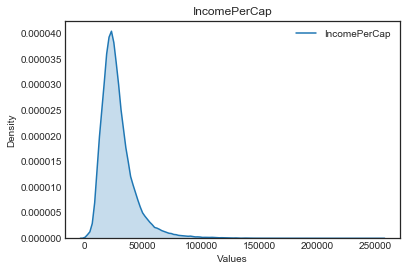

count     74001.000000
mean      28206.325919
std       15237.665719
min           0.000000
25%       18912.000000
50%       25218.000000
75%       33773.000000
max      254204.000000
Name: IncomePerCap, dtype: float64


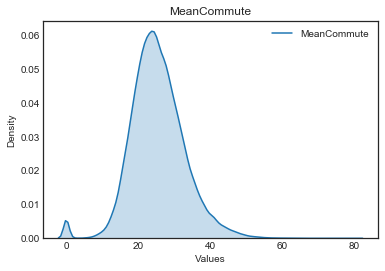

count    74001.000000
mean        25.377400
std          7.420189
min          0.000000
25%         20.700000
50%         24.900000
75%         29.700000
max         80.000000
Name: MeanCommute, dtype: float64


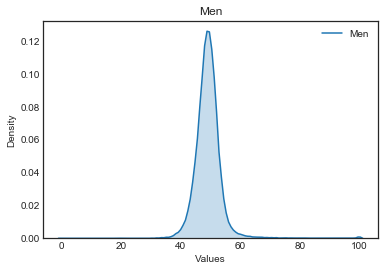

count    74001.000000
mean        48.736928
std          6.686946
min          0.000000
25%         46.802181
50%         49.018853
75%         51.115619
max        100.000000
Name: Men, dtype: float64


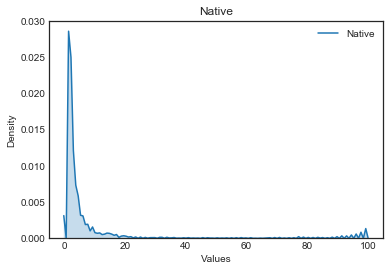

count    74001.000000
mean         0.720940
std          4.467913
min          0.000000
25%          0.000000
50%          0.000000
75%          0.400000
max        100.000000
Name: Native, dtype: float64


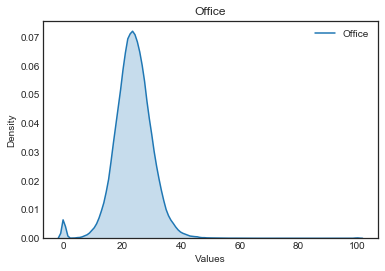

count    74001.000000
mean        23.718504
std          6.371045
min          0.000000
25%         20.000000
50%         23.700000
75%         27.500000
max        100.000000
Name: Office, dtype: float64


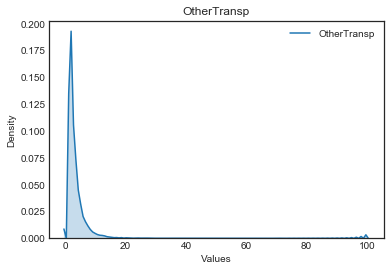

count    74001.000000
mean         1.897506
std          2.685575
min          0.000000
25%          0.400000
50%          1.100000
75%          2.500000
max        100.000000
Name: OtherTransp, dtype: float64


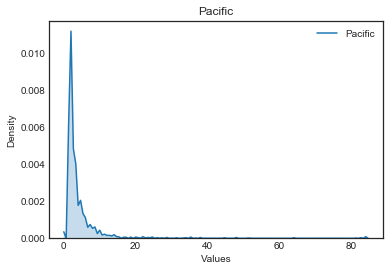

count    74001.00000
mean         0.14366
std          1.03260
min          0.00000
25%          0.00000
50%          0.00000
75%          0.00000
max         84.70000
Name: Pacific, dtype: float64


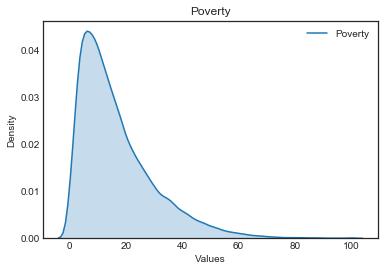

count    74001.00000
mean        16.80047
std         13.22665
min          0.00000
25%          7.10000
50%         13.30000
75%         23.00000
max        100.00000
Name: Poverty, dtype: float64


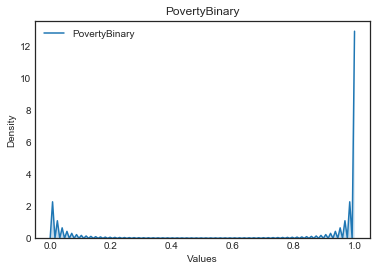

count    74001.000000
mean         0.061013
std          0.239355
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: PovertyBinary, dtype: float64


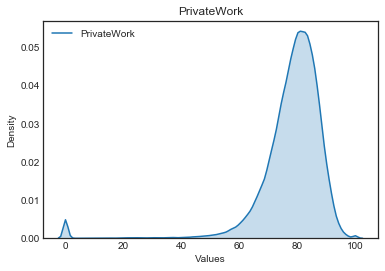

count    74001.000000
mean        78.142136
std         11.506742
min          0.000000
25%         74.400000
50%         80.000000
75%         84.600000
max        100.000000
Name: PrivateWork, dtype: float64


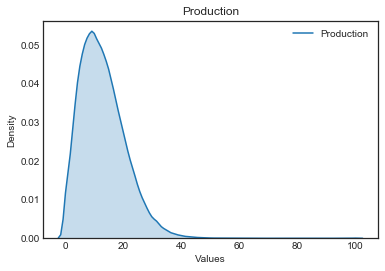

count    74001.000000
mean        12.743949
std          7.740286
min          0.000000
25%          6.900000
50%         11.700000
75%         17.400000
max        100.000000
Name: Production, dtype: float64


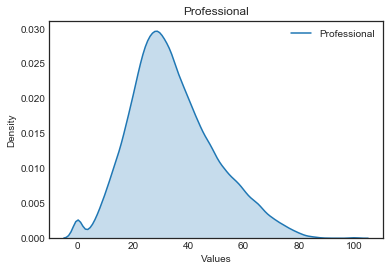

count    74001.000000
mean        34.447495
std         15.313865
min          0.000000
25%         23.800000
50%         32.400000
75%         43.700000
max        100.000000
Name: Professional, dtype: float64


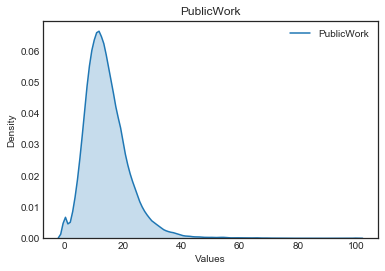

count    74001.000000
mean        14.490257
std          7.635074
min          0.000000
25%          9.500000
50%         13.300000
75%         18.200000
max        100.000000
Name: PublicWork, dtype: float64


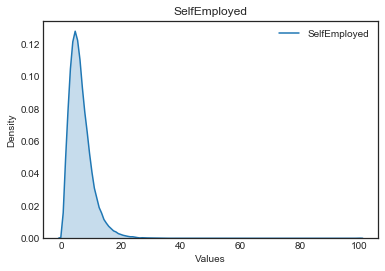

count    74001.000000
mean         6.193976
std          4.107698
min          0.000000
25%          3.500000
50%          5.500000
75%          8.100000
max        100.000000
Name: SelfEmployed, dtype: float64


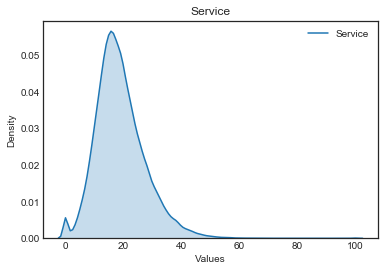

count    74001.000000
mean        18.921219
std          8.444077
min          0.000000
25%         13.300000
50%         17.800000
75%         23.500000
max        100.000000
Name: Service, dtype: float64


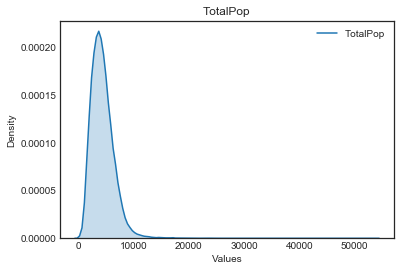

count    74001.000000
mean      4325.591465
std       2129.306903
min          0.000000
25%       2891.000000
50%       4063.000000
75%       5442.000000
max      53812.000000
Name: TotalPop, dtype: float64


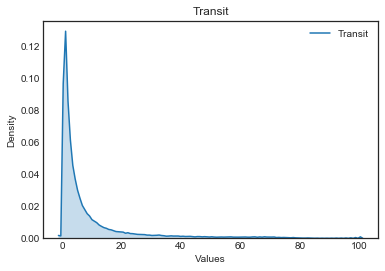

count    74001.000000
mean         5.423561
std         11.688321
min          0.000000
25%          0.000000
50%          1.000000
75%          4.700000
max        100.000000
Name: Transit, dtype: float64


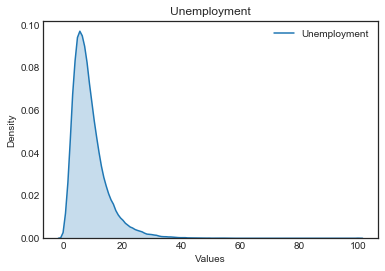

count    74001.000000
mean         8.957406
std          6.005733
min          0.000000
25%          5.000000
50%          7.600000
75%         11.300000
max        100.000000
Name: Unemployment, dtype: float64


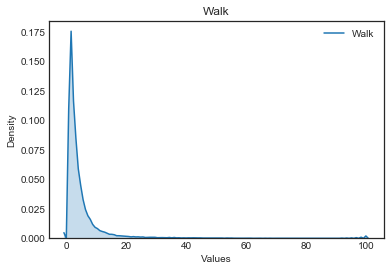

count    74001.000000
mean         3.115975
std          5.896004
min          0.000000
25%          0.400000
50%          1.400000
75%          3.400000
max        100.000000
Name: Walk, dtype: float64


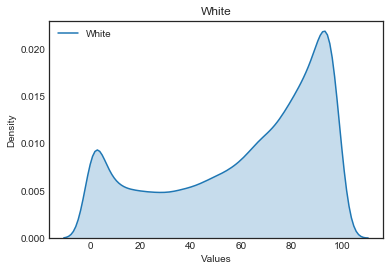

count    74001.000000
mean        61.453706
std         31.117254
min          0.000000
25%         37.900000
50%         71.000000
75%         88.200000
max        100.000000
Name: White, dtype: float64


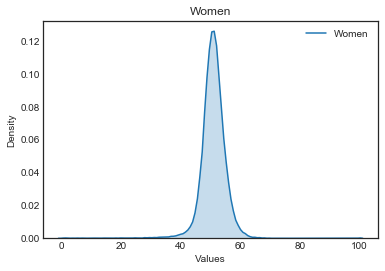

count    74001.000000
mean        50.330653
std          6.797153
min          0.000000
25%         48.787995
50%         50.912584
75%         53.089989
max        100.000000
Name: Women, dtype: float64


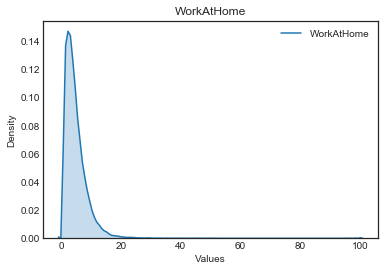

count    74001.000000
mean         4.347322
std          3.958005
min          0.000000
25%          1.800000
50%          3.500000
75%          5.900000
max        100.000000
Name: WorkAtHome, dtype: float64


In [107]:
columns_to_plot = census.columns[2:33].sort_values()
for column in columns_to_plot: 
    sns.kdeplot(census[column], shade=True)
    plt.title(column)
    plt.xlabel('Values')
    plt.ylabel('Density')
    plt.show()
    print(census[column].describe())

### Feature-Target Relationships

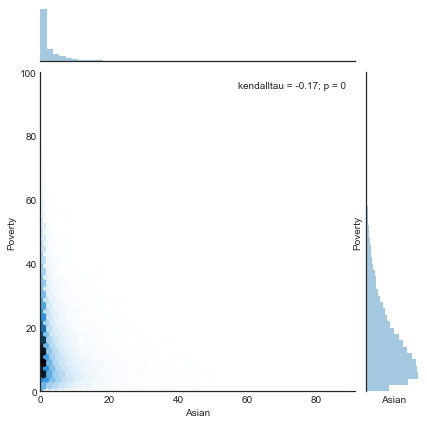

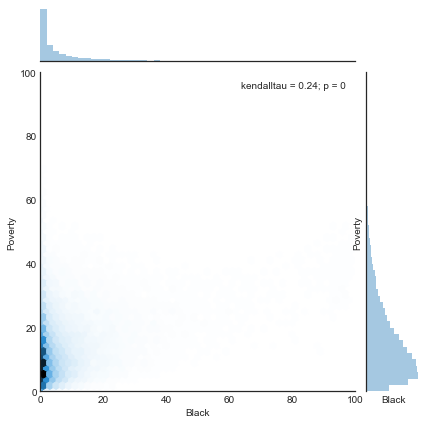

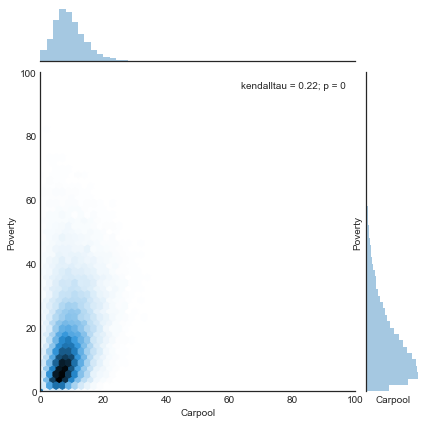

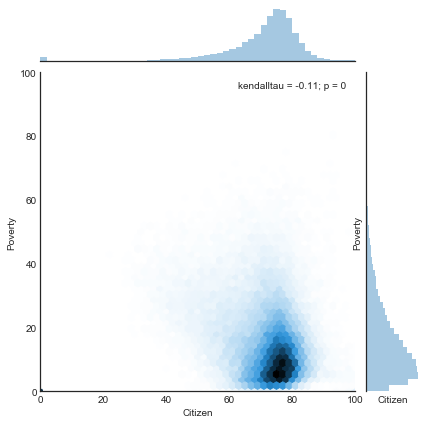

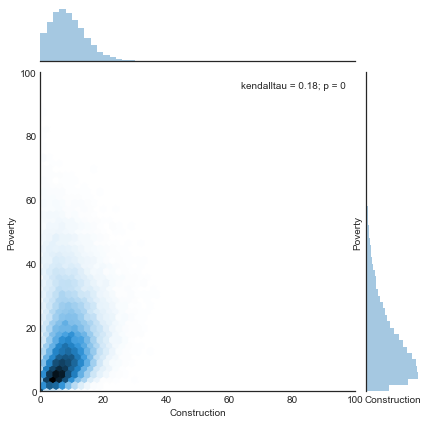

...

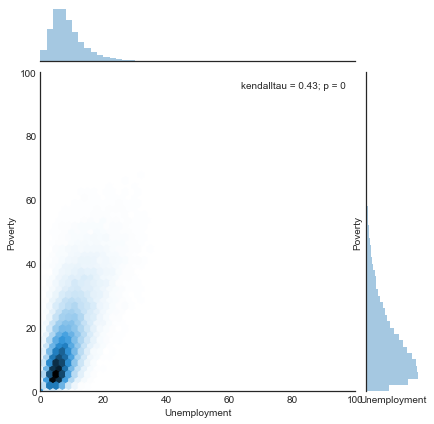

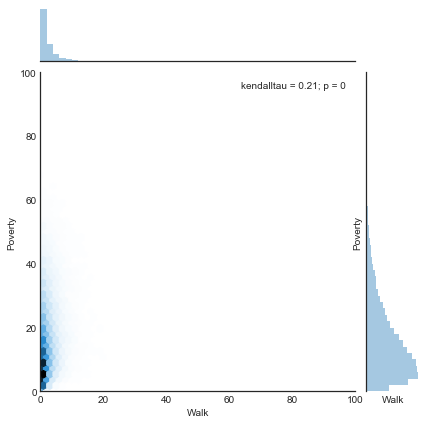

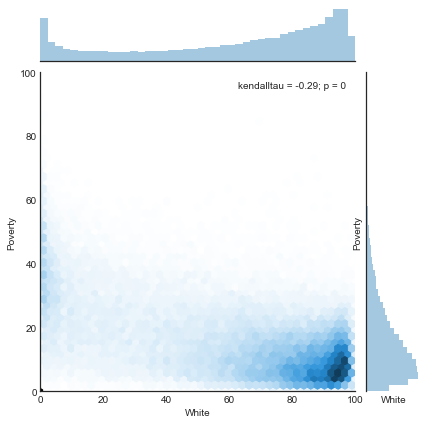

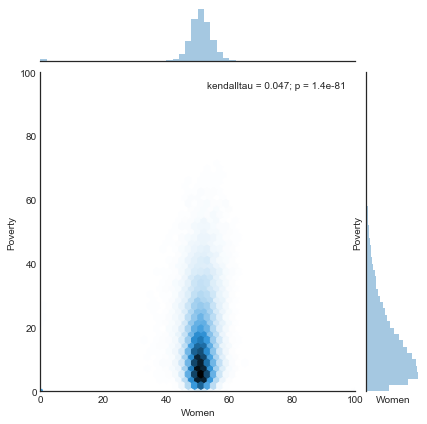

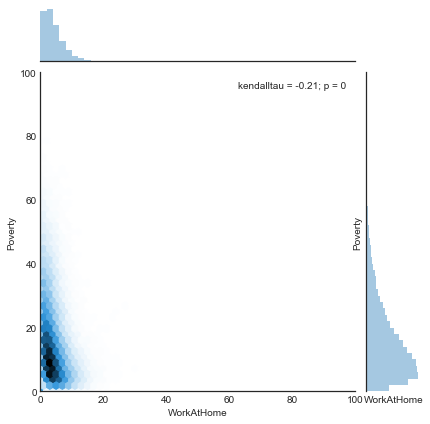

In [104]:
X = (census.drop(['County','Poverty','PovertyBinary', 'State'], 1).sort_index(axis = 1)).columns
for column in X: 
    sns.jointplot(column, 'Poverty', data = census, kind='hex', stat_func=kendalltau)
    plt.xlabel(column)
    plt.ylabel('Poverty')
    plt.show()

### Multicollinearity

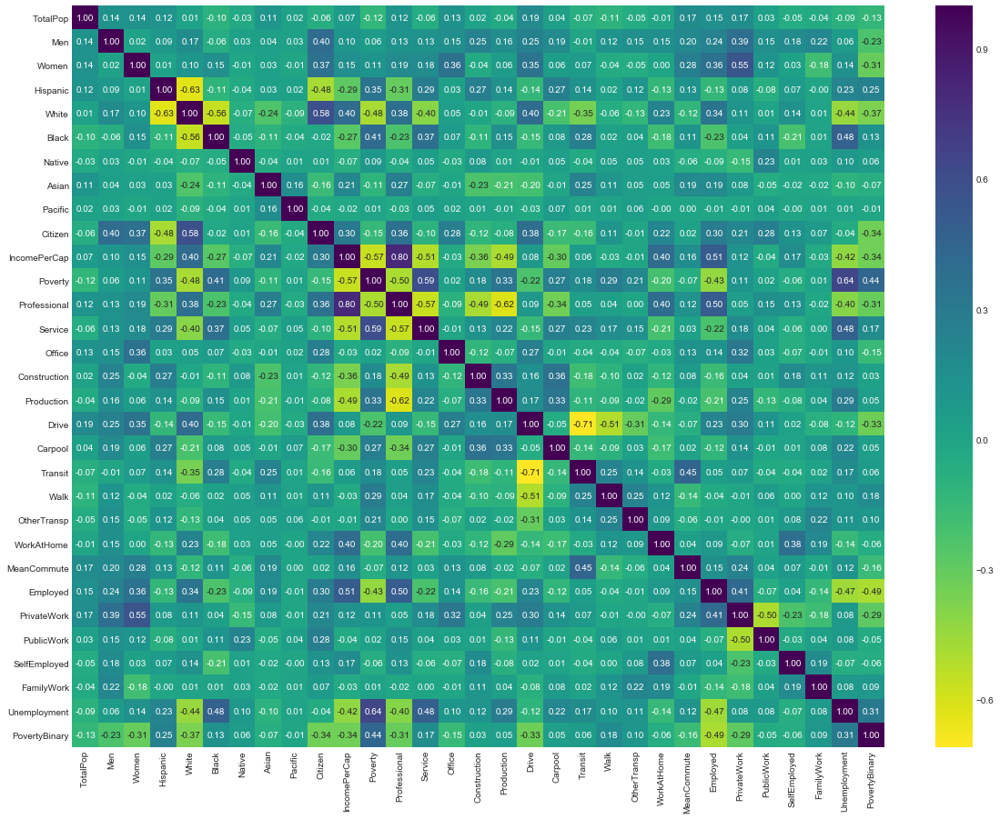

In [105]:
plt.figure(figsize=[20,15])
correlations = sns.heatmap(census.corr(), annot=True, fmt='.2f', cmap='viridis_r')
plt.show()

### Multivariate

#### Employment & Poverty By State

In [108]:
def hexbin(x, y, color, **kwargs):
    cmap = sns.light_palette(color, as_cmap=True)
    plt.hexbin(x, y, gridsize=15, cmap=cmap, **kwargs)

##### **Employment Sector**

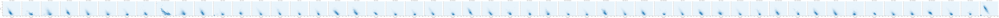

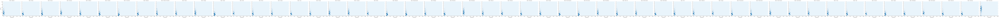

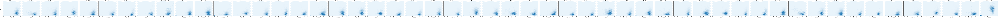

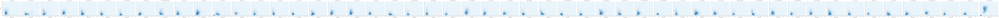

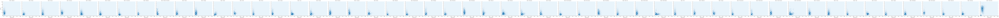

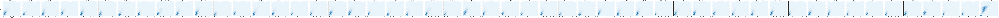

In [113]:
employment_sector = census[['Employed','FamilyWork','PrivateWork','PublicWork','SelfEmployed','Unemployment']].columns
for each in employment_sector: 
    g = sns.FacetGrid(census, col='State', size=4)
    g = g.map(hexbin, each, 'Poverty', extent=[0, 100, 0, 100])
plt.show()

##### **Employment Industry**

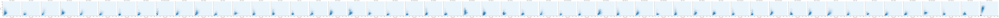

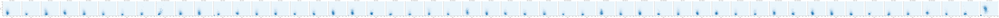

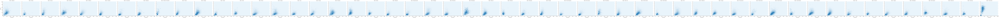

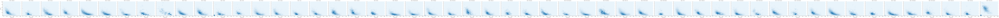

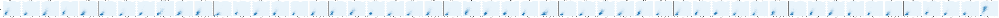

In [115]:
employment_industry = census[['Construction','Office','Production','Professional','Service']].columns
for each in employment_industry: 
    g = sns.FacetGrid(census, col='State', size=4)
    g = g.map(hexbin, each, 'Poverty', extent=[0, 100, 0, 100])
plt.show()

#### Ethnicity/Race & Poverty By State

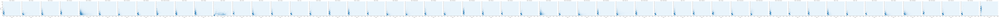

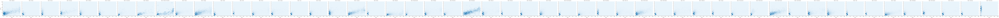

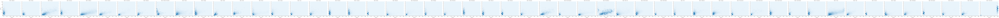

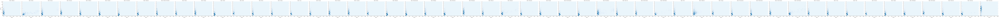

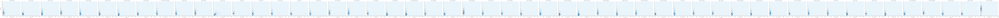

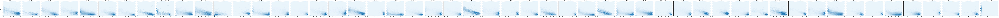

In [111]:
ethnicity_race = census[['Asian','Black','Hispanic','Native','Pacific','White']].columns
for each in ethnicity_race: 
    g = sns.FacetGrid(census, col='State', size=4)
    g = g.map(hexbin, each, 'Poverty', extent=[0, 100, 0, 100])
plt.show()

#### Gender & Poverty By State

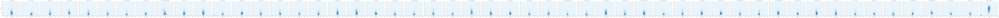

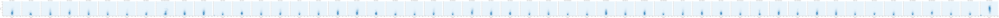

In [117]:
gender = census[['Men','Women']].columns
for each in gender: 
    g = sns.FacetGrid(census, col='State', size=4)
    g = g.map(hexbin, each, 'Poverty', extent=[0, 100, 0, 100])
plt.show()

#### Immigration Status & Poverty By State

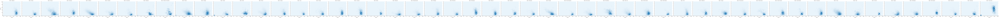

In [118]:
g = sns.FacetGrid(census, col='State', size=4)
g = g.map(hexbin, 'Citizen', 'Poverty', extent=[0, 100, 0, 100])
plt.show()

#### Transportation & Poverty By State

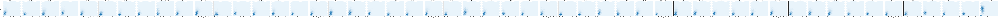

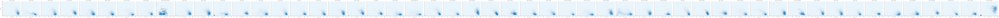

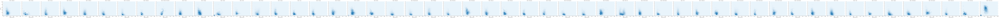

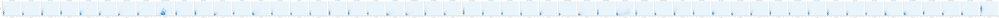

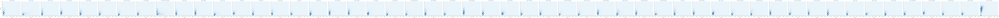

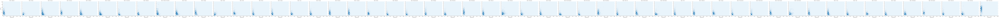

In [119]:
transportation = census[['Carpool','Drive','MeanCommute','Transit','Walk','WorkAtHome']].columns
for each in transportation:
    g = sns.FacetGrid(census, col='State', size=4)
    g = g.map(hexbin, each, 'Poverty', extent=[0, 100, 0, 100])
    plt.show()

# Modeling & Hyperparameter Tuning

## Dimensionality Reduction

In [27]:
scaler = StandardScaler()
X = census.drop(['County','IncomePerCap','Poverty','PovertyBinary','State'], 1)
X_scaled = scaler.fit_transform(X)
Y = census['PovertyBinary'].values.reshape(-1,1)

### By Feature Importances

In [28]:
rfc = ensemble.RandomForestClassifier()
rfc.fit(X_scaled,Y)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [29]:
names_importances = {}

for feature, importance in zip(X.columns, rfc.feature_importances_):
    names_importances[feature] = importance

names_importances_desc = sorted(names_importances.items(), key=lambda x: x[1], reverse=True)
names_importances_desc = pd.DataFrame(names_importances_desc, columns=['Feature','Importance'])

In [30]:
names_importances_desc.head(10)

,Feature,Importance
0,Employed,0.150061
1,White,0.111954
2,Citizen,0.078958
3,Professional,0.066573
4,Hispanic,0.058280
5,Women,0.057586
6,Unemployment,0.057102
7,MeanCommute,0.038181
8,Drive,0.037099
9,Black,0.031264


### By Feature Coefficients

In [34]:
Y_lasso = census['Poverty']

In [112]:
lasso = linear_model.Lasso()
lasso.fit(X_scaled, Y_lasso)
coefficients = lasso.coef_
scores = cross_val_score(lasso, X_scaled, Y_lasso, cv=5)
print('Feature Coefficients: {}\n'.format(coefficients))

Feature Coefficients: [-0.          0.          0.          0.81955064 -0.9226502   0.35420991
  0.         -0.         -0.         -0.         -0.21534263  3.15314795
  0.          0.          1.06169382 -0.          0.02974039  0.
  1.74785528  0.17053615 -0.         -0.28461752 -1.15690518  0.
 -0.         -0.         -0.          4.11643982]



In [36]:
indices = [3, 4, 5, 10, 11, 14, 15, 16, 18, 19, 21, 22, 27]
for index in indices:
    print('\'{}\''.format(X.columns[index]))

'Hispanic'
'White'
'Black'
'Professional'
'Service'
'Production'
'Drive'
'Carpool'
'Walk'
'OtherTransp'
'MeanCommute'
'Employed'
'Unemployment'


### Selected Features

**Listed in alphabetical order**:
- 'Black'
- 'Carpool'
- 'Citizen'
- 'Drive'
- 'Employed'
- 'Hispanic'
- 'MeanCommute'
- 'OtherTransp'
- 'Production'
- 'Professional'
- 'Service'
- 'Unemployment'
- 'Walk'
- 'White'
- 'Women'

















## Random Forest Pipeline

### Classifier



In [182]:
scaler = StandardScaler()
selector1 = SelectKBest(f_classif, k=10)
rfc2 = ensemble.RandomForestClassifier()

X_model = census[['Black','Carpool','Citizen','Drive','Employed','Hispanic', 'MeanCommute', 'OtherTransp', 'Production', 'Professional', 'Service', 'Unemployment', 'Walk', 'White', 'Women']]
Y1 = Y

In [40]:
rfc_pipe = Pipeline(steps=[('Scaler', scaler), ('Selector', selector1),('RFC2', rfc2)])

n_estimators = [10,50,100]
max_depth = [5,10,15]
parameters = dict(RFC2__n_estimators = n_estimators, RFC2__max_depth = max_depth)
rfc_optimal = GridSearchCV(rfc_pipe, parameters)

rfc_optimal.fit(X_model, Y1)
optimal_n_estimators = rfc_optimal.best_estimator_.get_params()['RFC2__n_estimators']
optimal_max_depth = rfc_optimal.best_estimator_.get_params()['RFC2__max_depth']

rfc_optimal_scores = cross_val_score(rfc_optimal.best_estimator_, X_model, Y1, cv=10)

print('Optimal Number of Estimators: {}.\n'.format(optimal_n_estimators))
print('Optimal Maximum Depth: {}.\n'.format(optimal_max_depth))
print('10-Fold Cross-Validation Scores: {}\n'.format(rfc_optimal_scores))
print('Average Score (10-Fold Cross-Validation): {:.2%}.\n'.format(rfc_optimal_scores.mean()))
print('Score Error (10-Fold Cross-Validation): {:.2%}.\n'.format(rfc_optimal_scores.std()))

Optimal Number of Estimators: 100.

Optimal Maximum Depth: 15.

10-Fold Cross-Validation Scores: [0.96216727 0.97446291 0.9695987  0.97446291 0.96662613 0.96824324
 0.96553588 0.96458981 0.97553723 0.97229355]

Average Score (10-Fold Cross-Validation): 96.94%.

Score Error (10-Fold Cross-Validation): 0.44%.



### Selected Features

In [190]:
selected_rfc = rfc_optimal.best_estimator_.named_steps['Selector'].get_support()
features = X_model.columns
for i,j in zip(selected_rfc,features): 
    if i == True:
        print('\'{}\''.format(j)) 

'Black'
'Carpool'
'Citizen'
'Drive'
'Employed'
'Hispanic'
'MeanCommute'
'Production'
'Unemployment'
'White'


### Predictive Power Evaluation: Confusion Matrix

In [156]:
Y_pred = rfc_optimal.predict(X_model)
rfc_cm = confusion_matrix(Y1, Y_pred)

In [157]:
print(rfc_cm)

[[69486     0]
 [  316  4199]]


In [159]:
tI_errors = (rfc_cm[0][1]/(rfc_cm[0][0]+rfc_cm[0][1]+rfc_cm[1][0]+rfc_cm[1][1]))
tII_errors = (rfc_cm[1][0]/(rfc_cm[0][0]+rfc_cm[0][1]+rfc_cm[1][0]+rfc_cm[1][1]))
print(('Type I Error Rate: {:.2%}.\n'
       'Type II Error Rate: {:.2%}.\n').format(tI_errors, tII_errors))

Type I Error Rate: 0.00%.
Type II Error Rate: 0.43%.



## Lasso Pipeline

### Regressor

In [165]:
selector2 = SelectKBest(f_regression, k=10)
Y2 = Y_lasso

In [179]:
lambd = [0.5, 1, 1.5]
parameters = dict(Lasso__alpha = lambd)

In [180]:
lasso_pipe = Pipeline(steps=[('Scaler', scaler), ('Selector', selector2),('Lasso', lasso)])
lasso_optimal = GridSearchCV(lasso_pipe, parameters)
lasso_optimal.fit(X_model, Y2)

optimal_lambd = lasso_optimal.best_estimator_.get_params()['Lasso__alpha']
lasso_optimal_scores = cross_val_score(lasso_optimal.best_estimator_, X_model, Y2, cv=10)

print('Optimal Alpha: {}.\n'.format(optimal_lambd))
print('10-Fold Cross-Validation Scores: {}\n'.format(lasso_optimal_scores))
print('Average Score (10-Fold Cross-Validation): {:.2%}.\n'.format(lasso_optimal_scores.mean()))
print('Score Error (10-Fold Cross-Validation): {:.2%}.\n'.format(lasso_optimal_scores.std()))

Optimal Alpha: 0.5.

10-Fold Cross-Validation Scores: [0.54965046 0.49123481 0.56787172 0.60626983 0.66721936 0.57827567
 0.57875966 0.65876133 0.55429052 0.61982793]

Average Score (10-Fold Cross-Validation): 58.72%.

Score Error (10-Fold Cross-Validation): 5.02%.



### Selected Features

In [191]:
selected_lasso = lasso_optimal.best_estimator_.named_steps['Selector'].get_support()
features = X_model.columns
for i,j in zip(selected_lasso,features): 
    if i == True:
        print('\'{}\''.format(j)) 

'Black'
'Carpool'
'Drive'
'Employed'
'MeanCommute'
'Professional'
'Service'
'Unemployment'
'Walk'
'White'


### Predictive Power Evaluation: Homoscedasticity Plot

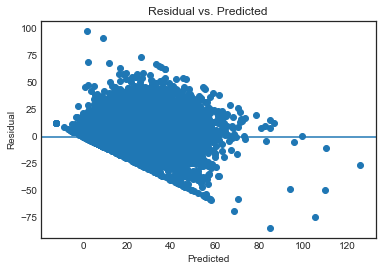

In [181]:
predicted = lasso_optimal.predict(X_model).ravel()
actual = Y2
residual = actual - predicted
plt.scatter(predicted, residual)
plt.xlabel('Predicted')
plt.ylabel('Residual')
plt.axhline(y=0)
plt.title('Residual vs. Predicted')
plt.show()

## Support Vector Machine 

### Classifier

In [80]:
svc = SVC()

In [83]:
C = [1,2]
kernel = ['linear', 'rbf']
parameters = dict(SVC__C = C, SVC__kernel = kernel)

In [84]:
svc_pipe = Pipeline(steps=[('Scaler', scaler), ('Selector', selector1),('SVC', svc)])
svc_optimal = GridSearchCV(svc_pipe, parameters)
svc_optimal.fit(X_model, Y1)

optimal_C1 = svc_optimal.best_estimator_.get_params()['SVC__C']
optimal_kernel1 = svc_optimal.best_estimator_.get_params()['SVC__kernel']
svc_optimal_scores = cross_val_score(svc_optimal.best_estimator_, X_model, Y1, cv=10)

print('Optimal C: {}.\n'.format(optimal_C1))
print('Optimal Kernel: {}.\n'.format(optimal_kernel1))
print('10-Fold Cross-Validation Scores: {}\n'.format(svc_optimal_scores))
print('Average Score (10-Fold Cross-Validation): {:.2%}.\n'.format(svc_optimal_scores.mean()))
print('Score Error (10-Fold Cross-Validation): {:.2%}.\n'.format(svc_optimal_scores.std()))

Optimal C: 2.

Optimal Kernel: rbf.

10-Fold Cross-Validation Scores: [0.96419403 0.9759492  0.97149034 0.97446291 0.9679773  0.96527027
 0.95972429 0.96377889 0.976213   0.97310447]

Average Score (10-Fold Cross-Validation): 96.92%.

Score Error (10-Fold Cross-Validation): 0.55%.



In [192]:
selected_svc = svc_optimal.best_estimator_.named_steps['Selector'].get_support()
features = X_model.columns
for i,j in zip(selected_svc,features): 
    if i == True:
        print('\'{}\''.format(j)) 

'Black'
'Carpool'
'Citizen'
'Drive'
'Employed'
'Hispanic'
'MeanCommute'
'Production'
'Unemployment'
'White'


### Predictive Power Evaluation: Confusion Matrix

In [160]:
Y_pred = svc_optimal.predict(X_model)
svc_cm = confusion_matrix(Y1, Y_pred)

In [162]:
print(svc_cm)

[[69026   460]
 [ 1199  3316]]


In [164]:
tI_errors = (svc_cm[0][1]/(svc_cm[0][0]+svc_cm[0][1]+svc_cm[1][0]+svc_cm[1][1]))
tII_errors = (svc_cm[1][0]/(svc_cm[0][0]+svc_cm[0][1]+svc_cm[1][0]+svc_cm[1][1]))
print(('Type I Error Rate: {:.2%}.\n'
       'Type II Error Rate: {:.2%}.\n').format(tI_errors, tII_errors))

Type I Error Rate: 0.62%.
Type II Error Rate: 1.62%.



### Regressor

Classes for regression different from classes for classification - binary vs. non-binary. Different methods react differently. Classification is easier than regression. 

In [175]:
svr = SVR()

In [176]:
C = [1,2]
kernel = ['linear', 'rbf']
parameters = dict(SVR__C = C, SVR__kernel = kernel)

In [177]:
svr_pipe = Pipeline(steps=[('Scaler', scaler), ('Selector', selector2),('SVR', svr)])
svr_optimal = GridSearchCV(svr_pipe, parameters)
svr_optimal.fit(X_model, Y2)

optimal_C2 = svr_optimal.best_estimator_.get_params()['SVR__C']
optimal_kernel2 = svr_optimal.best_estimator_.get_params()['SVR__kernel']
svr_optimal_scores = cross_val_score(svr_optimal.best_estimator_, X_model, Y2, cv=10)

print('Optimal C: {}.\n'.format(optimal_C2))
print('Optimal Kernel: {}.\n'.format(optimal_kernel2))
print('10-Fold Cross-Validation Scores: {}\n'.format(svr_optimal_scores))
print('Average Score (10-Fold Cross-Validation): {:.2%}.\n'.format(svr_optimal_scores.mean()))
print('Score Error (10-Fold Cross-Validation): {:.2%}.\n'.format(svr_optimal_scores.std()))

Optimal C: 2.

Optimal Kernel: rbf.

10-Fold Cross-Validation Scores: [0.63918013 0.63893022 0.6442779  0.68494055 0.74238484 0.70301447
 0.65956083 0.72460867 0.63283183 0.70312492]

Average Score (10-Fold Cross-Validation): 67.73%.

Score Error (10-Fold Cross-Validation): 3.76%.



### Selected Features

In [193]:
selected_svr = svr_optimal.best_estimator_.named_steps['Selector'].get_support()
features = X_model.columns
for i,j in zip(selected_svr,features): 
    if i == True:
        print('\'{}\''.format(j)) 

'Black'
'Carpool'
'Drive'
'Employed'
'MeanCommute'
'Professional'
'Service'
'Unemployment'
'Walk'
'White'


### Predictive Power Evaluation: Homoscedasticity Plot

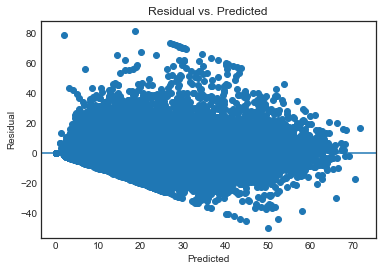

In [178]:
predicted = svr_optimal.predict(X_model).ravel()
actual = Y2
residual = actual - predicted
plt.scatter(predicted, residual)
plt.xlabel('Predicted')
plt.ylabel('Residual')
plt.axhline(y=0)
plt.title('Residual vs. Predicted')
plt.show()